In [4]:
!pip install torchviz

In [5]:
!pip install torch-summary
!pip install yfinance

In [6]:
!pip install torch torchvision torchaudio

In [7]:
import torch
import numpy as np
import pandas as pd
import torch.nn as nn
import seaborn as sns
import yfinance as yf
import torch.optim as optim
import torch.functional as F
from torchviz import make_dot
from tqdm.notebook import tqdm
from datetime import timedelta
import matplotlib.pyplot as plt
from torchsummary import summary
from IPython.display import Image
import plotly.graph_objects as go
from keras.utils import plot_model
from keras.models import Sequential
from IPython.display import Image, display
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset, DataLoader
from tensorflow.keras.layers import Embedding, SpatialDropout1D, Bidirectional, LSTM, Dense, Dropout

In [8]:
tck = yf.Ticker("NVDA")
# defining the start date 
start_date = "1999-01-14"
# historical data
df = tck.history(start=start_date, end=None)
df

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
1999-01-22 00:00:00-05:00,0.040119,0.044775,0.035581,0.037612,2714688000,0.0,0.0
1999-01-25 00:00:00-05:00,0.040597,0.042029,0.037612,0.041552,510480000,0.0,0.0
1999-01-26 00:00:00-05:00,0.042029,0.042865,0.037731,0.038328,343200000,0.0,0.0
1999-01-27 00:00:00-05:00,0.038447,0.039403,0.036298,0.038209,244368000,0.0,0.0
1999-01-28 00:00:00-05:00,0.038209,0.038447,0.037850,0.038089,227520000,0.0,0.0
...,...,...,...,...,...,...,...
2025-04-15 00:00:00-04:00,110.970001,113.620003,110.500000,112.199997,228966900,0.0,0.0
2025-04-16 00:00:00-04:00,104.550003,106.790001,100.449997,104.489998,397016900,0.0,0.0
2025-04-17 00:00:00-04:00,104.449997,104.470001,100.050003,101.489998,290833400,0.0,0.0


In [9]:
"""Data PreProcessing"""

'Data PreProcessing'

In [10]:
# Move column 'Close' to the first position
col_close = df.pop('Close')
df.insert(0, 'Close', col_close)
df.head()

,Close,Open,High,Low,Volume,Dividends,Stock Splits
Date,,,,,,,
1999-01-22 00:00:00-05:00,0.037612,0.040119,0.044775,0.035581,2714688000,0.0,0.0
1999-01-25 00:00:00-05:00,0.041552,0.040597,0.042029,0.037612,510480000,0.0,0.0
1999-01-26 00:00:00-05:00,0.038328,0.042029,0.042865,0.037731,343200000,0.0,0.0
1999-01-27 00:00:00-05:00,0.038209,0.038447,0.039403,0.036298,244368000,0.0,0.0
1999-01-28 00:00:00-05:00,0.038089,0.038209,0.038447,0.037850,227520000,0.0,0.0


In [11]:
df.columns

Index(['Close', 'Open', 'High', 'Low', 'Volume', 'Dividends', 'Stock Splits'], dtype='object')

In [12]:
df.shape

(6603, 7)

In [13]:
def check_df(df: object, head: object = 5) -> object:
    print("\nShape")
    print(df.shape)
    print("\nTypes")
    print(df.dtypes)
    print("\nNANs")
    print(df.isnull().sum())
    print("\nInfo")
    print(df.info())
check_df(df)


Shape
(6603, 7)

Types
Close           float64
Open            float64
High            float64
Low             float64
Volume            int64
Dividends       float64
Stock Splits    float64
dtype: object

NANs
Close           0
Open            0
High            0
Low             0
Volume          0
Dividends       0
Stock Splits    0
dtype: int64

Info
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6603 entries, 1999-01-22 00:00:00-05:00 to 2025-04-22 00:00:00-04:00
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Close         6603 non-null   float64
 1   Open          6603 non-null   float64
 2   High          6603 non-null   float64
 3   Low           6603 non-null   float64
 4   Volume        6603 non-null   int64  
 5   Dividends     6603 non-null   float64
 6   Stock Splits  6603 non-null   float64
dtypes: float64(6), int64(1)
memory usage: 412.7 KB
None


In [14]:
df['Volume'] = df['Volume'].astype('float64')

In [15]:
print('Number of duplicated rows: ' , len(df[df.duplicated()]))

Number of duplicated rows:  0


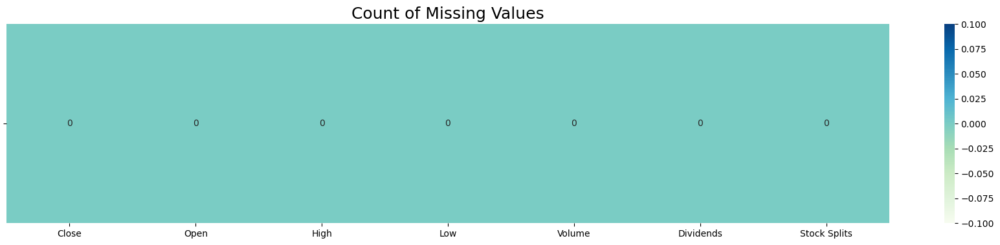

In [16]:
plt.figure(figsize=(22,4))
sns.heatmap((df.isna().sum()).to_frame(name='').T,cmap='GnBu', annot=True,
             fmt='0.0f').set_title('Count of Missing Values', fontsize=18)
plt.show()

In [17]:
df.describe().T.style.background_gradient(cmap='GnBu', axis=1)

,count,mean,std,min,25%,50%,75%,max
Close,6603.000000,9.490613,25.388398,0.031283,0.258938,0.439092,4.776544,149.416245
Open,6603.000000,9.494360,25.422607,0.032000,0.258480,0.439449,4.783197,153.015919
High,6603.000000,9.672028,25.891540,0.032597,0.265930,0.444975,4.856612,153.115916
Low,6603.000000,9.294991,24.857549,0.030566,0.251359,0.432901,4.706386,147.806407
Volume,6603.000000,597160964.107224,429982624.720176,19680000.000000,336244000.000000,498372000.000000,728680000.000000,9230856000.000000
Dividends,6603.000000,0.000029,0.000377,0.000000,0.000000,0.000000,0.000000,0.010000
Stock Splits,6603.000000,0.003256,0.140422,0.000000,0.000000,0.000000,0.000000,10.000000


In [18]:
# finding unique data
df.apply(lambda x: len(x.unique()))

Close           5560
Open            6586
High            6576
Low             6566
Volume          6519
Dividends          9
Stock Splits       5
dtype: int64

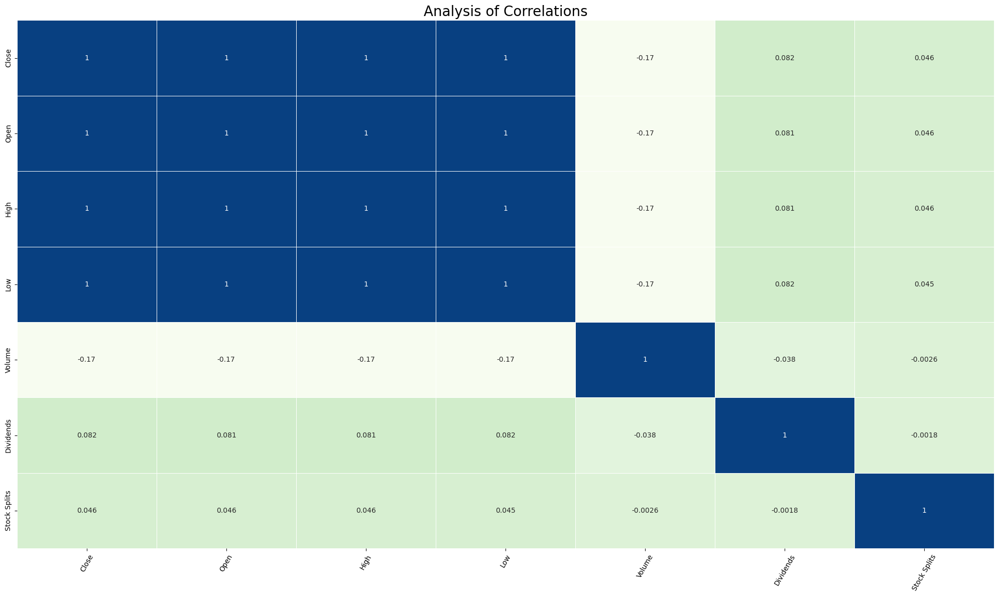

In [19]:
plt.figure(figsize=(20, 12))
sns.heatmap(df.corr(numeric_only=True), cmap="GnBu", annot=True, linewidths=.6 , cbar = False)
plt.xticks(rotation=60, size=10)
plt.yticks(size=10)
plt.title('Analysis of Correlations', size=20)
plt.tight_layout()
plt.show()

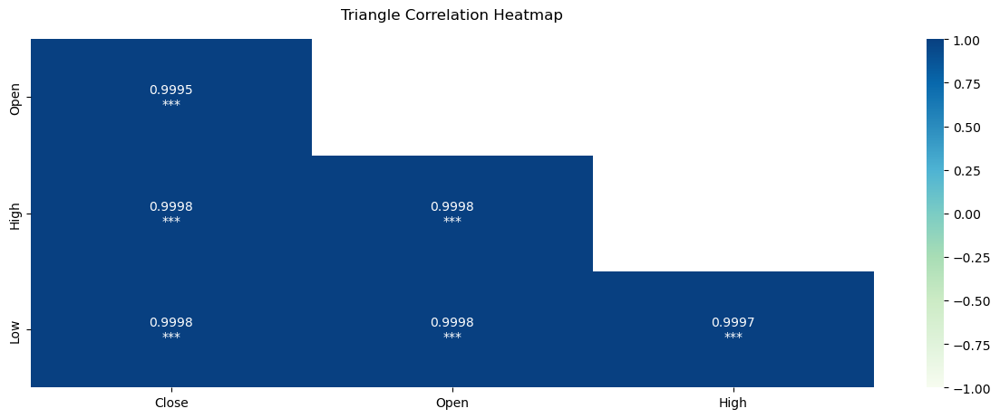

In [20]:
corr = df.corr(numeric_only=True)
f, ax = plt.subplots(figsize=(15, 5))
mask = np.triu(np.ones_like(corr, dtype=bool))
cut_off = 0.25
extreme_1 = 0.5
extreme_2 = 0.75
extreme_3 = 0.9
mask |= np.abs(corr) < cut_off
corr = corr[~mask]
remove_empty_rows_and_cols = True
if remove_empty_rows_and_cols:
    wanted_cols = np.flatnonzero(np.count_nonzero(~mask, axis=1))
    wanted_rows = np.flatnonzero(np.count_nonzero(~mask, axis=0))
    corr = corr.iloc[wanted_cols, wanted_rows]

annot = [[f"{val:.4f}"
          + ('' if abs(val) < extreme_1 else '\n*')
          + ('' if abs(val) < extreme_2 else '*')
          + ('' if abs(val) < extreme_3 else '*')
           for val in row] for row in corr.to_numpy()]
heatmap = sns.heatmap(corr, vmin=-1, vmax=1, annot=annot, fmt='', cmap='GnBu')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize': 12}, pad=16)
plt.show()


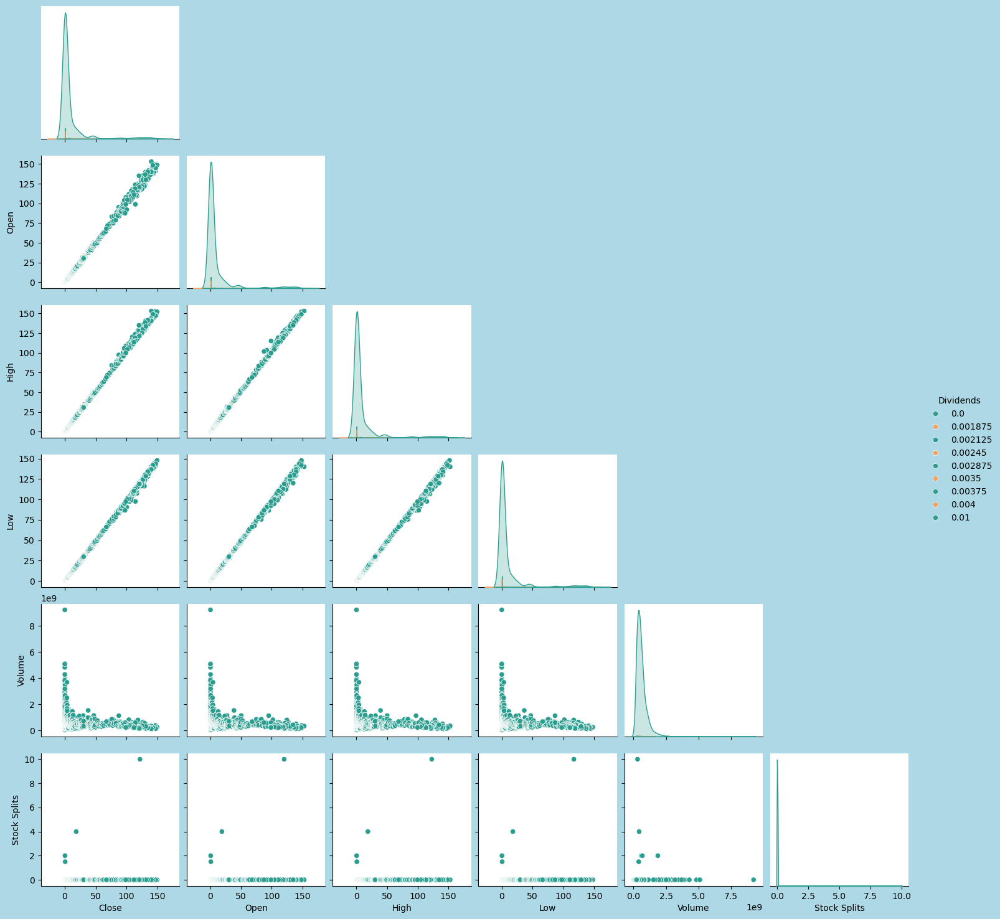

In [21]:
import warnings
warnings.filterwarnings('ignore')
custom_palette = sns.color_palette(['#2a9d8f', '#f4a261'])
sns.pairplot(data=df, diag_kind='kde', hue='Dividends', palette=custom_palette,corner=True)
plt.gcf().set_facecolor('#add8e6')
plt.show()

In [22]:
columns = df.columns

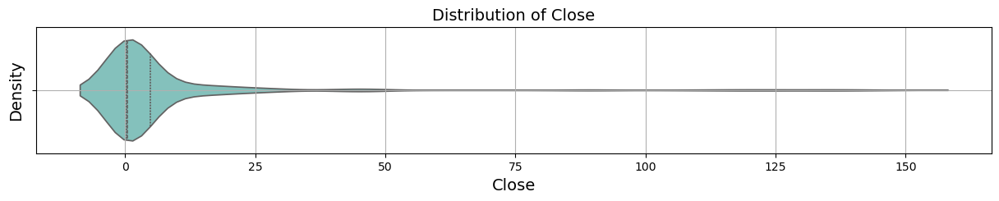

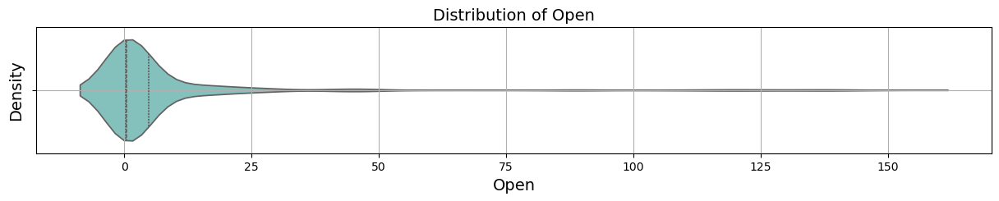

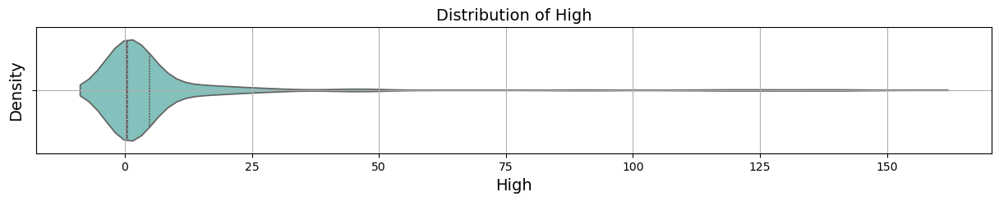

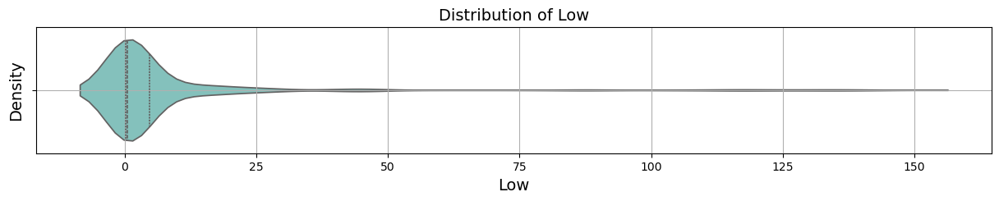

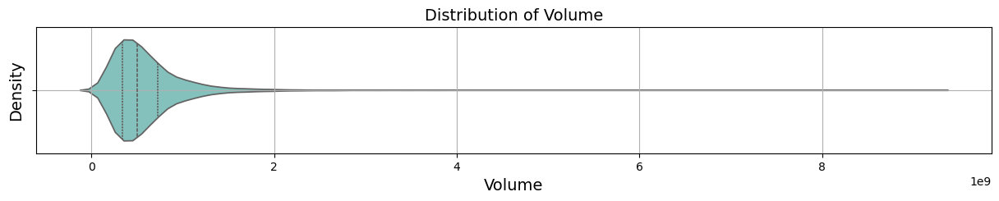

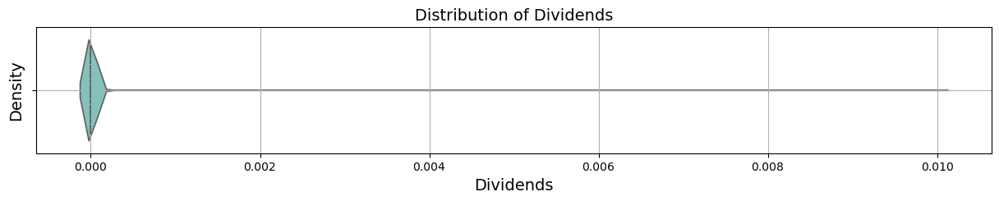

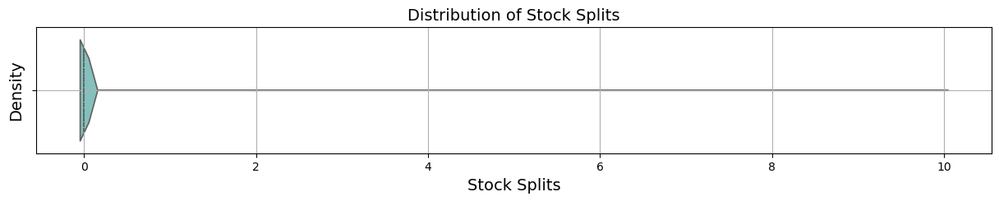

In [23]:
palette = "GnBu"
for column in columns:
    plt.figure(figsize=(15, 2)) 
    sns.violinplot(x=df[column], palette=palette, inner="quartile")  
    plt.title(f'Distribution of {column}', fontsize=14)
    plt.xlabel(column, fontsize=14)
    plt.ylabel('Density', fontsize=14)
    plt.grid(True)
    plt.show()


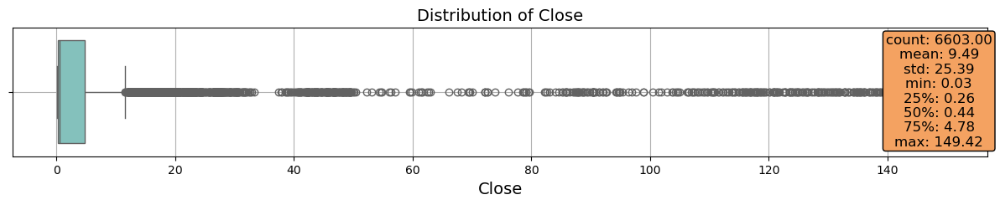

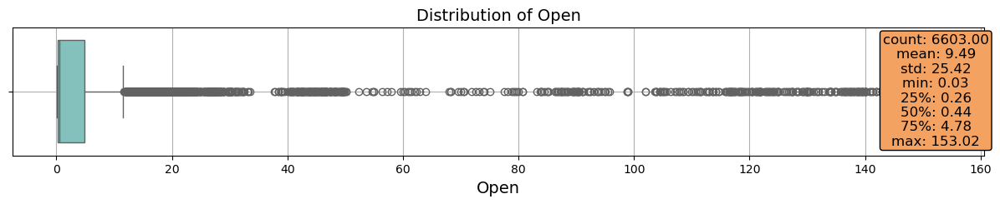

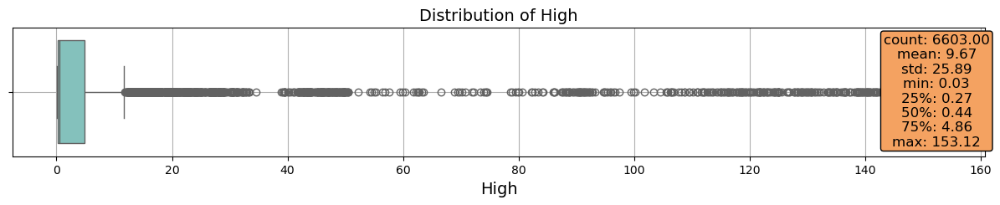

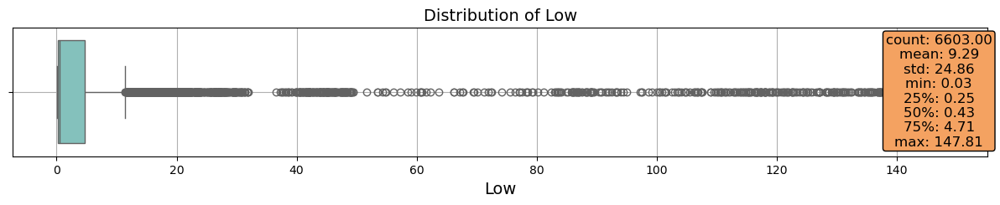

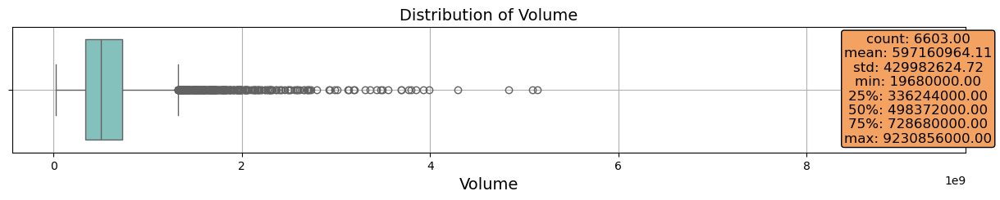

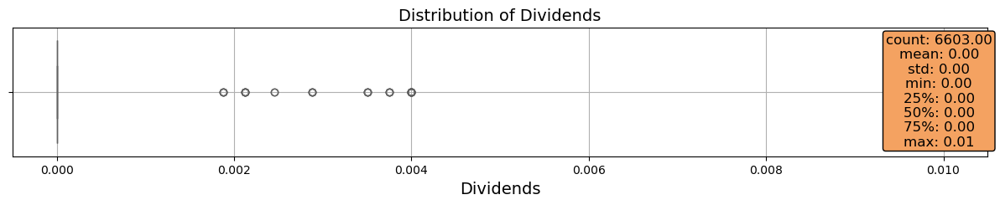

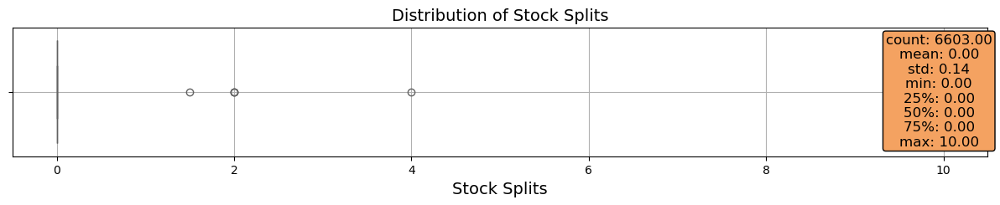

In [24]:
palette = "GnBu" 
for column in columns:
    plt.figure(figsize=(15, 2)) 
    sns.boxplot(x=df[column], palette=palette)
    plt.title(f'Distribution of {column}', fontsize=14)
    plt.xlabel(column, fontsize=14)
    stats = df[column].describe()
    stats_text = "\n".join([f"{key}: {value:.2f}" for key, value in stats.items()])
    plt.text(0.95, 0.95, stats_text, transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', 
             horizontalalignment='center', bbox=dict(boxstyle='round,pad=0.2', edgecolor='black', facecolor='#f4a261'))
    plt.grid(True) 
    plt.show()

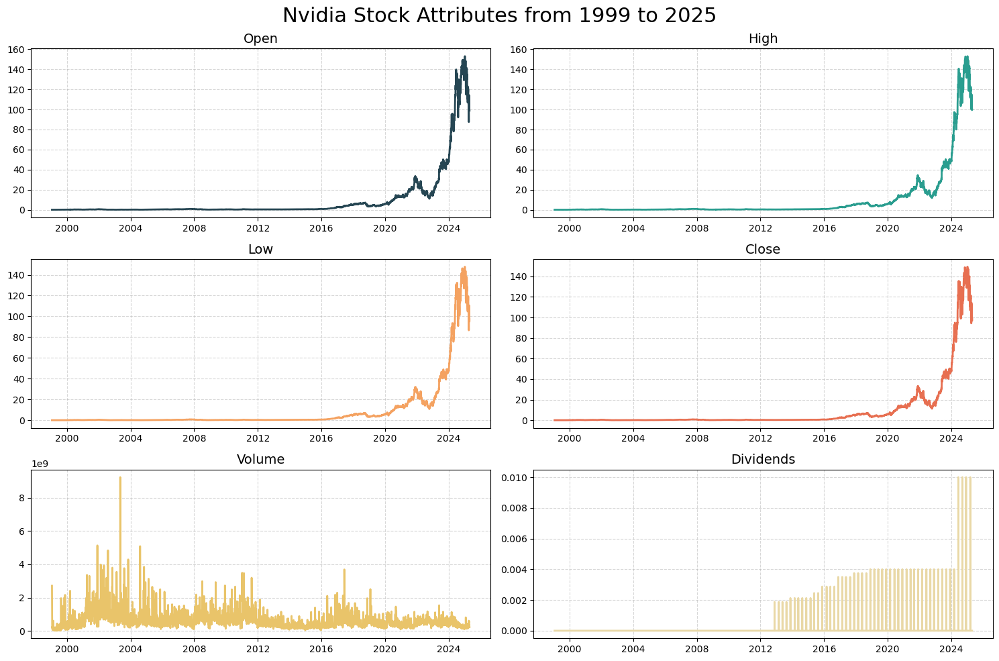

In [25]:
x=df.index
colors = ['#264653', '#2a9d8f', '#f4a261', '#e76f51','#e9c46a', '#e9d8a6']
plt.figure(figsize=(15, 10))
plt.subplot(3, 2, 1)
plt.plot(x, df['Open'], color=colors[0], linewidth=2)
plt.title('Open', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.subplot(3, 2, 2)
plt.plot(x, df['High'], color=colors[1], linewidth=2)
plt.title('High', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.subplot(3, 2, 3)
plt.plot(x, df['Low'], color=colors[2], linewidth=2)
plt.title('Low', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.subplot(3, 2, 4)
plt.plot(x, df['Close'], color=colors[3], linewidth=2)
plt.title('Close', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.subplot(3, 2, 5)
plt.plot(x, df['Volume'], color=colors[4], linewidth=2)
plt.title('Volume', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.subplot(3, 2, 6)
plt.plot(x, df['Dividends'], color=colors[5], linewidth=2)
plt.title('Dividends', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.suptitle('Nvidia Stock Attributes from 1999 to 2025', fontsize=22, y=0.98)
plt.tight_layout()
plt.show()

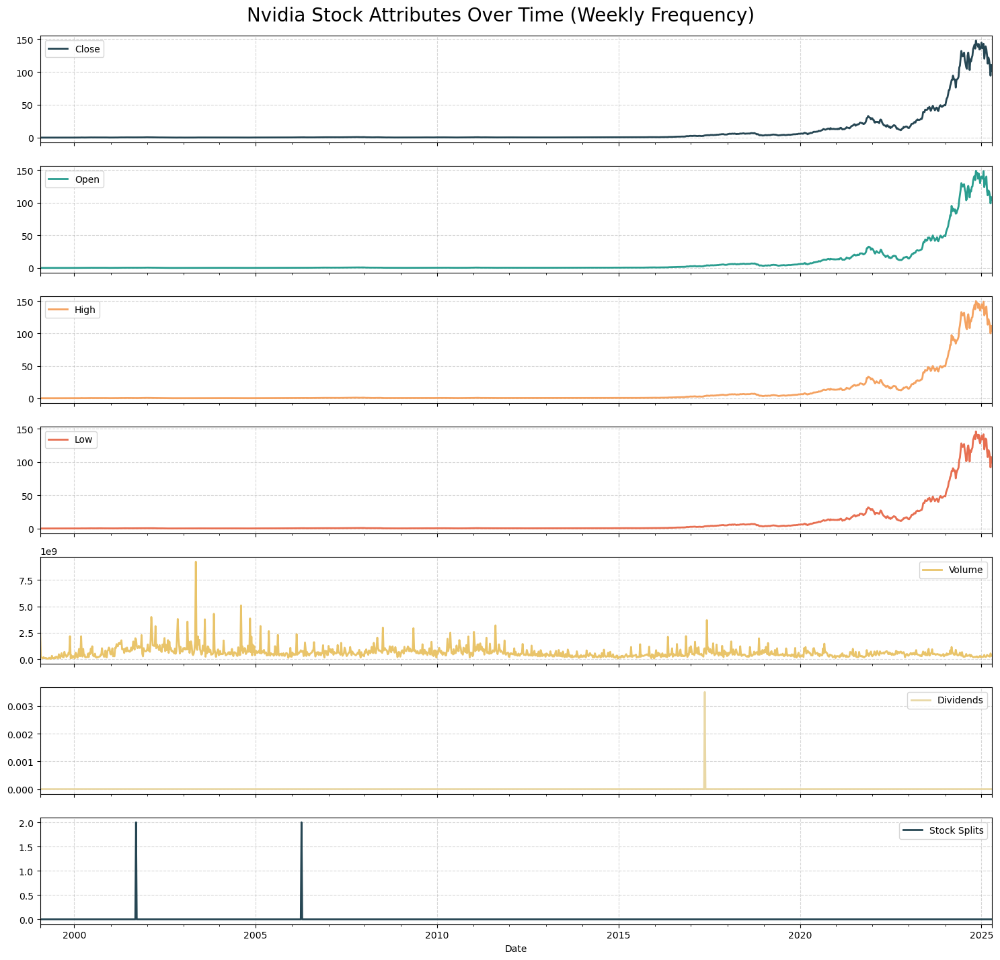

In [26]:
colors = ['#264653', '#2a9d8f', '#f4a261', '#e76f51', '#e9c46a', '#e9d8a6']
df_weekly = df.asfreq('W', method='ffill')
df_weekly.plot(subplots=True, figsize=(15, 15), style='-', color=colors, linewidth=2)
plt.suptitle('Nvidia Stock Attributes Over Time (Weekly Frequency)', fontsize=20, y=0.95)
for ax in plt.gcf().get_axes():
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_title(ax.get_title(), fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])  
plt.show()

In [27]:
# trace for candlestick chart
candletrace = go.Candlestick(
    x=df.index,
    open=df['Open'],
    high=df['High'],
    low=df['Low'],
    close=df['Close'],
    name='Candlestick',
    increasing=dict(line=dict(color='#2a9d8f')),
    decreasing=dict(line=dict(color='#f4a261')))
# layout for the chart with custom colors
layout = go.Layout(
    title='NVDA Candlestick Chart',
    xaxis=dict(title='Date', color='#2a9d8f'),
    yaxis=dict(title='Price', color='#2a9d8f', rangemode='normal'),
    plot_bgcolor='rgba(0,0,0,0)',  # transparent background
    paper_bgcolor='rgba(255,255,255,0.85)')  # slight transparency on paper background)
# creating the figure
fig = go.Figure(data=[candletrace], layout=layout)
# removing the range slider and showing the figure
fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

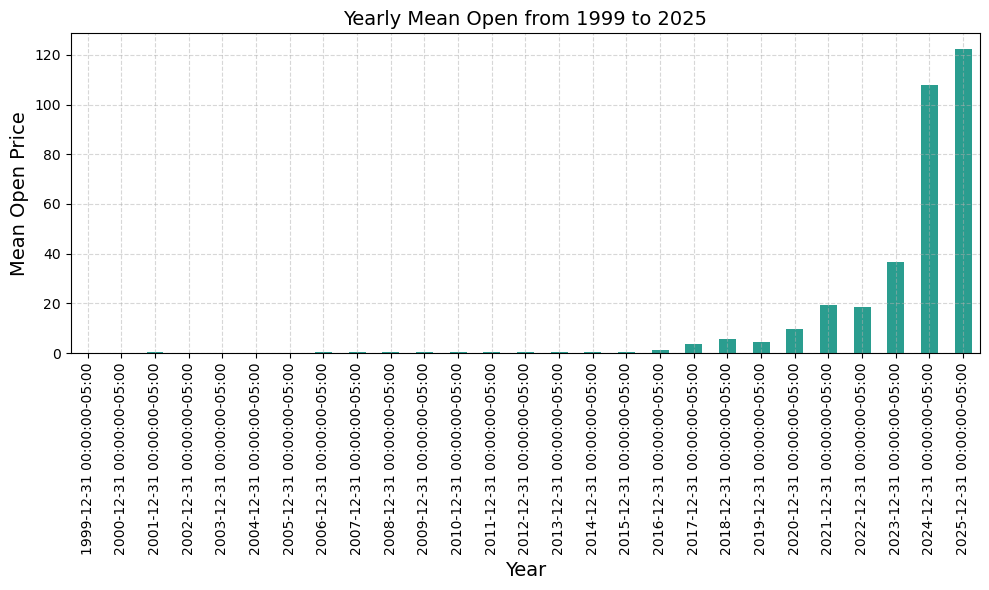

In [28]:
import math
import yfinance as yf
import datetime as dt
# Resampling the 'Open' data by year-end and plotting the mean values
plt.figure(figsize=(10, 6))  # Set figure size
df['Open'].resample('A').mean().plot(kind='bar', color='#2a9d8f')  # Updated color
plt.title('Yearly Mean Open from 1999 to 2025', fontsize=14)  # Title with larger font
plt.xlabel('Year', fontsize=14)  # X-axis label with larger font
plt.ylabel('Mean Open Price', fontsize=14)  # Y-axis label with larger font
plt.grid(True, linestyle='--', alpha=0.5)  # Grid with dashed lines
plt.tight_layout()  # Adjust layout to fit everything nicely
plt.show()

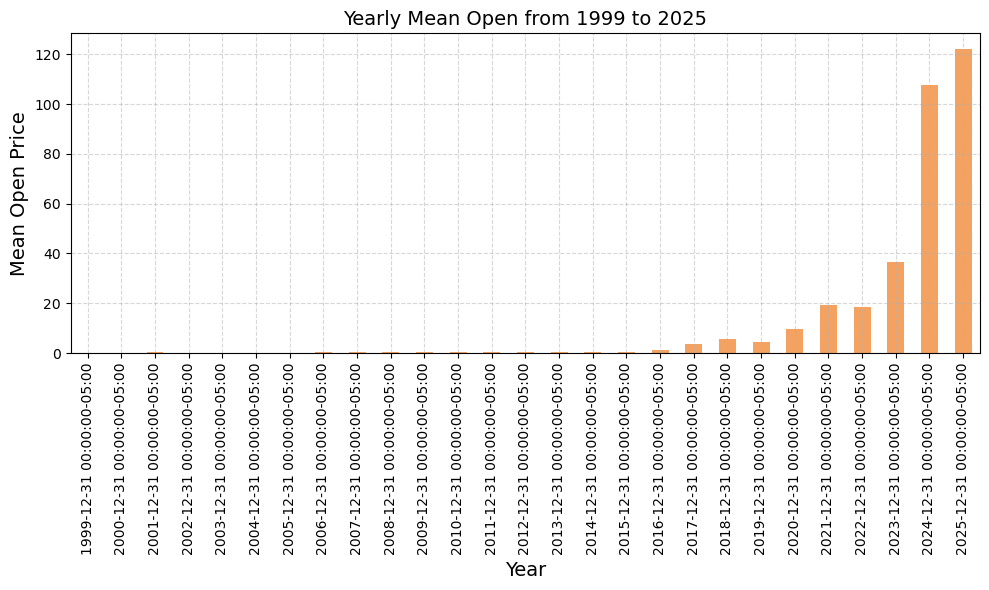

In [29]:
plt.figure(figsize=(10, 6)) 
df['Close'].resample('A').mean().plot(kind='bar', color='#f4a261')
plt.title('Yearly Mean Open from 1999 to 2025', fontsize=14) 
plt.xlabel('Year', fontsize=14)  
plt.ylabel('Mean Open Price', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout() 
plt.show()

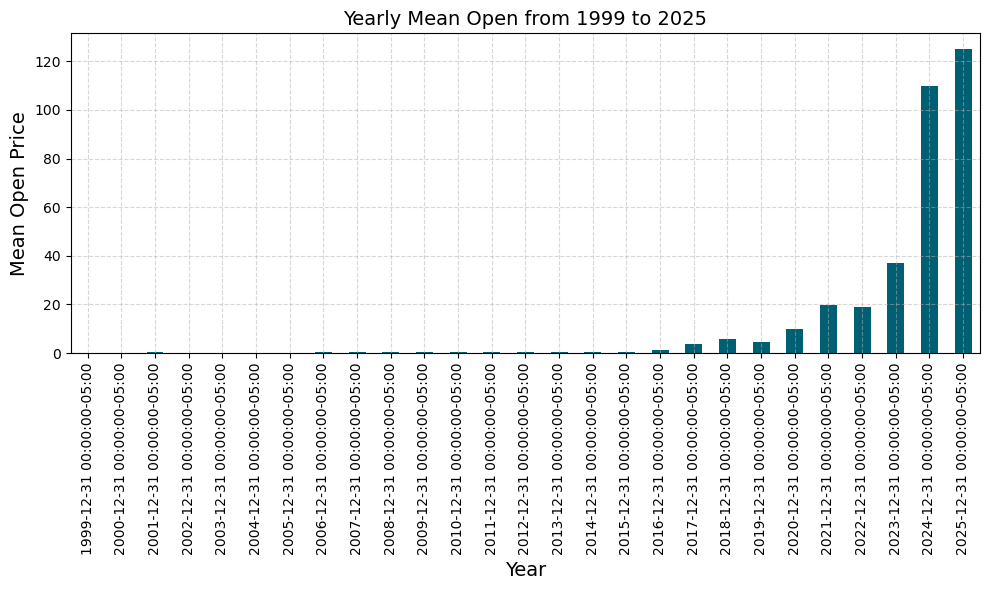

In [30]:
plt.figure(figsize=(10, 6)) 
df['High'].resample('A').mean().plot(kind='bar', color='#005f73')
plt.title('Yearly Mean Open from 1999 to 2025', fontsize=14) 
plt.xlabel('Year', fontsize=14)  
plt.ylabel('Mean Open Price', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout() 
plt.show()

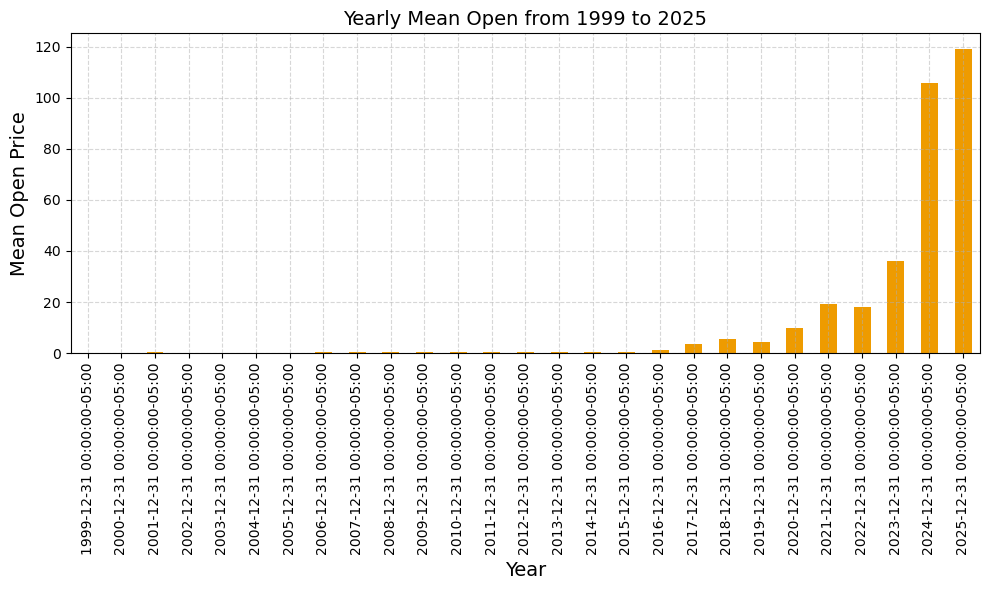

In [31]:
plt.figure(figsize=(10, 6)) 
df['Low'].resample('A').mean().plot(kind='bar', color='#ee9b00')
plt.title('Yearly Mean Open from 1999 to 2025', fontsize=14) 
plt.xlabel('Year', fontsize=14)  
plt.ylabel('Mean Open Price', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout() 
plt.show()

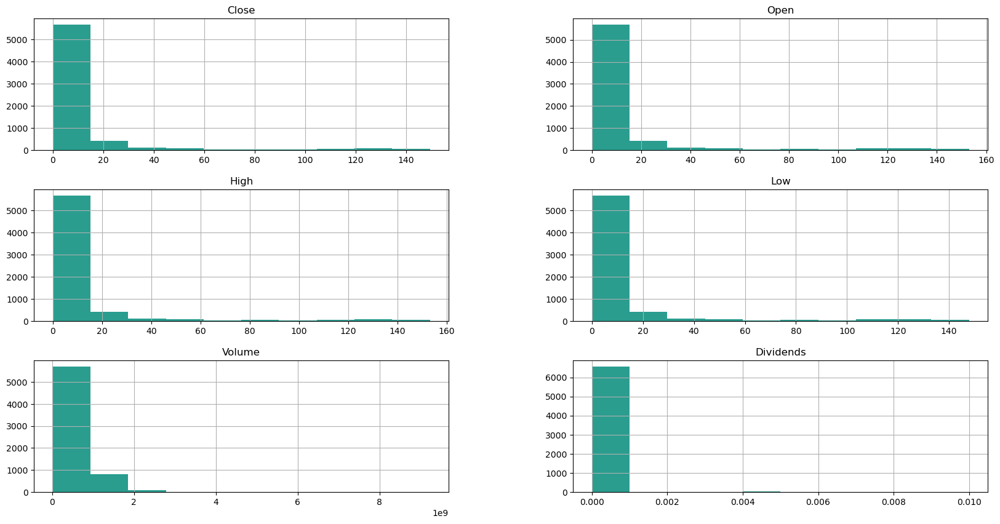

In [32]:
df1 = df.copy()
df1.drop("Stock Splits", axis=1, inplace=True)
fig = plt.figure(figsize = (20,10))
ax = fig.gca()
hist=df1.hist(ax = ax , color= '#2a9d8f')

In [33]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
import numpy as np

# Assuming df is your dataframe with 'Date' as index and 'Close', 'Open', 'High', 'Low' columns
# Set the date range filter directly (1999 to 2025)
# This assumes your original dataframe has this date range available
start_date = '1999-01-01'
end_date = '2025-04-23'  # Current date as per system
df_filtered = df[(df.index >= start_date) & (df.index <= end_date)]

# Calculate SMAs
md = [10, 20, 50, 200]
for SMA in md:
    col = f'SMA_{SMA}'
    df_filtered[col] = df_filtered['Close'].rolling(SMA).mean()

# Calculate MACD
df_filtered['EMA_12'] = df_filtered['Close'].ewm(span=12, adjust=False).mean()
df_filtered['EMA_26'] = df_filtered['Close'].ewm(span=26, adjust=False).mean()
df_filtered['MACD'] = df_filtered['EMA_12'] - df_filtered['EMA_26']
df_filtered['Signal_Line'] = df_filtered['MACD'].ewm(span=9, adjust=False).mean()
df_filtered['MACD_Histogram'] = df_filtered['MACD'] - df_filtered['Signal_Line']

# Calculate RSI
delta = df_filtered['Close'].diff()
gain = delta.where(delta > 0, 0)
loss = -delta.where(delta < 0, 0)
avg_gain = gain.rolling(window=14).mean()
avg_loss = loss.rolling(window=14).mean()
rs = avg_gain / avg_loss
df_filtered['RSI'] = 100 - (100 / (1 + rs))

# Create subplots with 4 rows: price chart, volume, MACD, and RSI
fig = make_subplots(rows=4, cols=1, shared_xaxes=True, 
                   vertical_spacing=0.03, 
                   row_heights=[0.55, 0.15, 0.15, 0.15],
                   subplot_titles=('Stock Price (1999-2025)', 'Volume', 'MACD', 'RSI'))

# Add candlestick chart
fig.add_trace(
    go.Candlestick(
        x=df_filtered.index,
        open=df_filtered['Open'], 
        high=df_filtered['High'],
        low=df_filtered['Low'], 
        close=df_filtered['Close'],
        name='OHLC',
        increasing_line_color='#26a69a', 
        decreasing_line_color='#ef5350'
    ),
    row=1, col=1
)

# Add SMAs with improved styling
sma_colors = ['rgba(255, 165, 0, 0.9)', 'rgba(34, 139, 34, 0.9)', 
              'rgba(220, 20, 60, 0.9)', 'rgba(75, 0, 130, 0.9)']
for i, sma in enumerate(md):
    fig.add_trace(
        go.Scatter(x=df_filtered.index, y=df_filtered[f'SMA_{sma}'],
                  mode='lines', name=f'SMA {sma}', line={'width': 1.5, 'color': sma_colors[i]}),
        row=1, col=1
    )

# Add volume chart with colored bars (green/red based on price direction)
colors = []
for i in range(len(df_filtered)):
    if i > 0:
        if df_filtered['Close'].iloc[i] > df_filtered['Close'].iloc[i-1]:
            colors.append('rgba(38, 166, 154, 0.7)')  # Green
        else:
            colors.append('rgba(239, 83, 80, 0.7)')   # Red
    else:
        colors.append('rgba(38, 166, 154, 0.7)')

fig.add_trace(
    go.Bar(x=df_filtered.index, y=df_filtered['Volume'],
          name='Volume', marker={'color': colors}),
    row=2, col=1
)

# Add MACD
fig.add_trace(
    go.Scatter(x=df_filtered.index, y=df_filtered['MACD'],
              line=dict(color='#2962ff', width=1.5), name='MACD'),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(x=df_filtered.index, y=df_filtered['Signal_Line'],
              line=dict(color='#ff6600', width=1.2), name='Signal'),
    row=3, col=1
)

# MACD Histogram
fig.add_trace(
    go.Bar(x=df_filtered.index, y=df_filtered['MACD_Histogram'],
          name='MACD Histogram',
          marker=dict(
              color=df_filtered['MACD_Histogram'].apply(
                  lambda x: 'rgba(38, 166, 154, 0.7)' if x >= 0 else 'rgba(239, 83, 80, 0.7)'
              )
          )),
    row=3, col=1
)

# Add RSI
fig.add_trace(
    go.Scatter(x=df_filtered.index, y=df_filtered['RSI'],
              line=dict(color='#9c27b0', width=1.5), name='RSI'),
    row=4, col=1
)

# Add RSI reference lines (30 and 70)
fig.add_trace(
    go.Scatter(x=[df_filtered.index[0], df_filtered.index[-1]], y=[70, 70],
              line=dict(color='rgba(255, 0, 0, 0.5)', width=1, dash='dash'), 
              name='Overbought', showlegend=False),
    row=4, col=1
)

fig.add_trace(
    go.Scatter(x=[df_filtered.index[0], df_filtered.index[-1]], y=[30, 30],
              line=dict(color='rgba(0, 255, 0, 0.5)', width=1, dash='dash'), 
              name='Oversold', showlegend=False),
    row=4, col=1
)

# Update layout with dark mode to look more like TradingView
fig.update_layout(
    title='Stock Price Analysis (1999-2025)',
    height=1000,
    plot_bgcolor='#1e1e1e',
    paper_bgcolor='#1e1e1e',
    margin=dict(l=50, r=30, t=80, b=50),
    font=dict(color='#e0e0e0'),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1,
        bgcolor='rgba(30, 30, 30, 0.5)',
        bordercolor='rgba(200, 200, 200, 0.5)',
        font=dict(color='#e0e0e0')
    ),
    xaxis_rangeslider_visible=False,
    dragmode='zoom',
    hovermode='x unified',
)

# Format axes for better readability
for i in range(1, 5):
    fig.update_xaxes(
        showgrid=True,
        gridwidth=1,
        gridcolor='rgba(80, 80, 80, 0.3)',
        showline=True,
        linewidth=1,
        linecolor='rgba(128, 128, 128, 0.8)',
        zeroline=False,
        tickfont=dict(size=10),
        row=i, col=1
    )
    
    fig.update_yaxes(
        showgrid=True,
        gridwidth=1,
        gridcolor='rgba(80, 80, 80, 0.3)',
        showline=True,
        linewidth=1,
        linecolor='rgba(128, 128, 128, 0.8)',
        zeroline=False,
        tickfont=dict(size=10),
        row=i, col=1
    )

# Specific settings for RSI axis
fig.update_yaxes(range=[0, 100], row=4, col=1)

# Add golden crosses and death crosses markers
golden_crosses = []
death_crosses = []

for i in range(1, len(df_filtered)):
    # Golden cross (SMA_50 crosses above SMA_200)
    if (df_filtered['SMA_50'].iloc[i-1] < df_filtered['SMA_200'].iloc[i-1] and
        df_filtered['SMA_50'].iloc[i] > df_filtered['SMA_200'].iloc[i]):
        golden_crosses.append(df_filtered.index[i])
    
    # Death cross (SMA_50 crosses below SMA_200)
    if (df_filtered['SMA_50'].iloc[i-1] > df_filtered['SMA_200'].iloc[i-1] and
        df_filtered['SMA_50'].iloc[i] < df_filtered['SMA_200'].iloc[i]):
        death_crosses.append(df_filtered.index[i])

# Add vertical lines for significant crosses
for date in golden_crosses:
    fig.add_shape(
        type="line",
        x0=date,
        y0=0,
        x1=date,
        y1=1,
        xref="x",
        yref="paper",
        line=dict(color="rgba(0, 255, 0, 0.5)", width=1, dash="dot"),
        layer="below",
        row=1, col=1
    )

for date in death_crosses:
    fig.add_shape(
        type="line",
        x0=date,
        y0=0,
        x1=date,
        y1=1,
        xref="x",
        yref="paper",
        line=dict(color="rgba(255, 0, 0, 0.5)", width=1, dash="dot"),
        layer="below",
        row=1, col=1
    )





# Show the figure
fig.show()

In [34]:
df[['Close']]

,Close
Date,
1999-01-22 00:00:00-05:00,0.037612
1999-01-25 00:00:00-05:00,0.041552
1999-01-26 00:00:00-05:00,0.038328
1999-01-27 00:00:00-05:00,0.038209
1999-01-28 00:00:00-05:00,0.038089
...,...
2025-04-15 00:00:00-04:00,112.199997
2025-04-16 00:00:00-04:00,104.489998
2025-04-17 00:00:00-04:00,101.489998


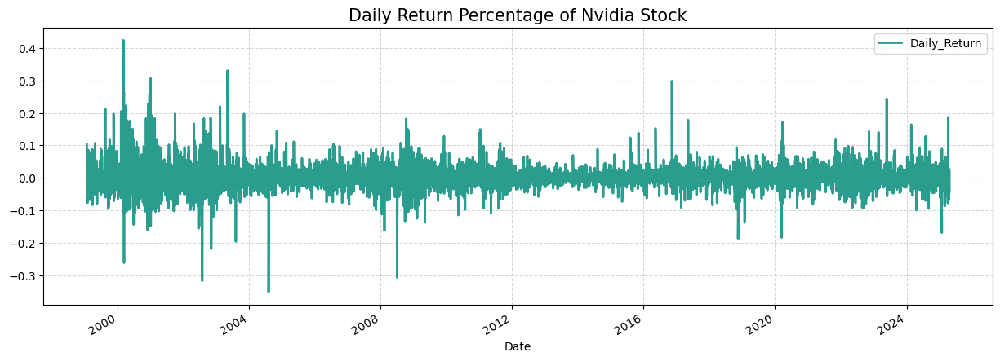

In [35]:
df['Daily_Return'] = df['Close'].pct_change()
df['Daily_Return'].plot(legend=True, figsize=(15, 5), color='#2a9d8f', linewidth=2)
plt.title('Daily Return Percentage of Nvidia Stock', fontsize=15)
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


In [36]:
df2 = df.copy(deep=True)

# Initialize the MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 1))

# Apply scaling to each column individually
df2['Open'] = scaler.fit_transform(df2.Open.values.reshape(-1, 1))
df2['High'] = scaler.fit_transform(df2.High.values.reshape(-1, 1))
df2['Low'] = scaler.fit_transform(df2.Low.values.reshape(-1, 1))
df2['Close'] = scaler.fit_transform(df2.Close.values.reshape(-1, 1))
df2['Volume'] = scaler.fit_transform(df2.Volume.values.reshape(-1, 1))

# Select the relevant columns for further processing
df3 = df2[['Open', 'High', 'Low', 'Volume', 'Close']].values

# Output the shape of the resulting dataframe
df3.shape

(6603, 5)

In [37]:
seq_len = 101
sequence = []
for index in range(len(df3) - seq_len + 1): 
    sequence.append(df3[index: index + seq_len])
sequence = np.array(sequence)
print(sequence.shape)

(6503, 101, 5)


In [38]:
def split_data(sequence):
    train_data, test_data = train_test_split(sequence, test_size=0.2, shuffle=False)
    val_data, test_data = train_test_split(test_data, test_size=0.5, shuffle=False)
    return train_data, val_data, test_data

In [39]:
train_data, val_data, test_data = split_data(sequence)
print("Train:", train_data.shape, "Validation:", val_data.shape, "Test:", test_data.shape)

Train: (5202, 101, 5) Validation: (650, 101, 5) Test: (651, 101, 5)


In [40]:
x_train = train_data[:, :-1, :]
y_train = train_data[:, -1, -1] 
x_valid = val_data[:, :-1, :]
y_valid = val_data[:, -1, -1]
x_test = test_data[:, :-1, :]
y_test = test_data[:, -1, -1]
print(f"x_train shape: {x_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"x_valid shape: {x_valid.shape}")
print(f"y_valid shape: {y_valid.shape}")
print(f"x_test shape: {x_test.shape}")
print(f"y_test shape: {y_test.shape}")

x_train shape: (5202, 100, 5)
y_train shape: (5202,)
x_valid shape: (650, 100, 5)
y_valid shape: (650,)
x_test shape: (651, 100, 5)
y_test shape: (651,)


In [41]:
model_lstm = Sequential()
model_lstm.add(LSTM(units=64, return_sequences=True, input_shape=(x_train.shape[1], x_train.shape[2])))
model_lstm.add(LSTM(units=32, return_sequences=False))
model_lstm.add(Dense(units=25))
model_lstm.add(Dense(units=1))

# Compile the model
model_lstm.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model_lstm.fit(x_train, y_train, epochs=50, batch_size=32,
                       validation_data=(x_valid, y_valid))

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0779 - val_loss: 0.0228
Epoch 2/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 2.7373e-04 - val_loss: 0.0190
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 2.2211e-04 - val_loss: 0.0138
Epoch 4/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 1.5703e-04 - val_loss: 0.0087
Epoch 5/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - loss: 1.0490e-04 - val_loss: 0.0050
Epoch 6/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 7s 42ms/step - loss: 8.0122e-05 - val_loss: 0.0032
Epoch 7/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 5.3466e-05 - val_loss: 0.0020
Epoch 8/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 3.4358e-05 - val_loss: 0.0011
Epoch 9/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/step - loss: 1.9779e-05 - val_loss: 5.1894e-04
Epoch 10/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 1.0549e-05 - val_loss: 3.8070e-04
Epoch 11/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - loss: 6.6258e-06 - val_loss:

In [42]:
# Predict on the test data
y_pred = model_lstm.predict(x_test)

# Evaluate the predictions0
test_loss = model_lstm.evaluate(x_test, y_test)
print("Test Loss:", test_loss)

21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0164
Test Loss: 0.05616440996527672


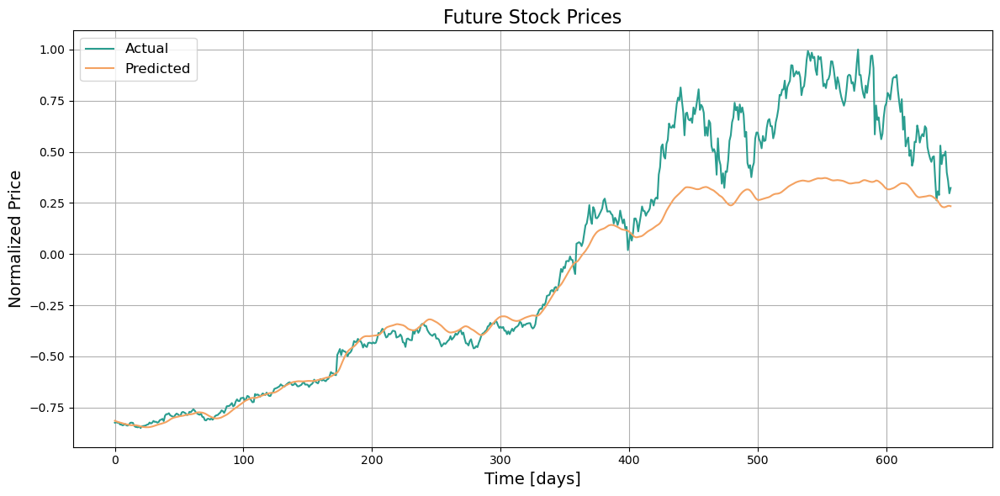

In [43]:
plt.figure(figsize=(12, 6))
idx = 0
plt.plot(y_test, color='#2a9d8f', label='Actual')  
plt.plot(y_pred, color='#f4a261', label='Predicted') 
plt.title('Future Stock Prices', fontsize=16)
plt.xlabel('Time [days]', fontsize=14)
plt.ylabel('Normalized Price', fontsize=14)
plt.legend(loc='best', fontsize=12)
plt.grid()
plt.tight_layout() 
plt.show()

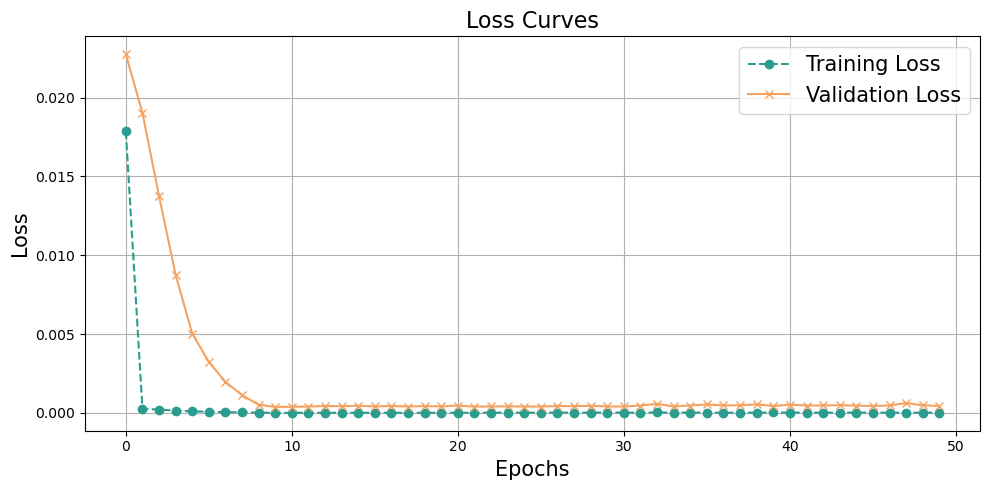

In [44]:
# Plotting the loss curves
def plot_loss_curve(history):
    plt.figure(figsize=(10, 5))

    # Loss curve
    plt.plot(history.history['loss'], label='Training Loss', color='#2a9d8f', marker='o', linestyle='--')
    plt.plot(history.history['val_loss'], label='Validation Loss', color='#f4a261', marker='x', linestyle='-')
    
    plt.title('Loss Curves', fontsize=16)
    plt.xlabel('Epochs', fontsize=15)
    plt.ylabel('Loss', fontsize=15)
    plt.legend(fontsize=15)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Call the function to plot the loss curve
plot_loss_curve(history)


In [45]:
print("### Model Summary ###")
model_lstm.summary()


### Model Summary ###


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 100, 64)        │        17,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 25)             │           825 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            26 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 93,563 (365.48 KB)

 Trainable params: 31,187 (121.82 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 62,376 (243.66 KB)

In [46]:
!pip install pydot

In [47]:
!pip install mplfinance

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


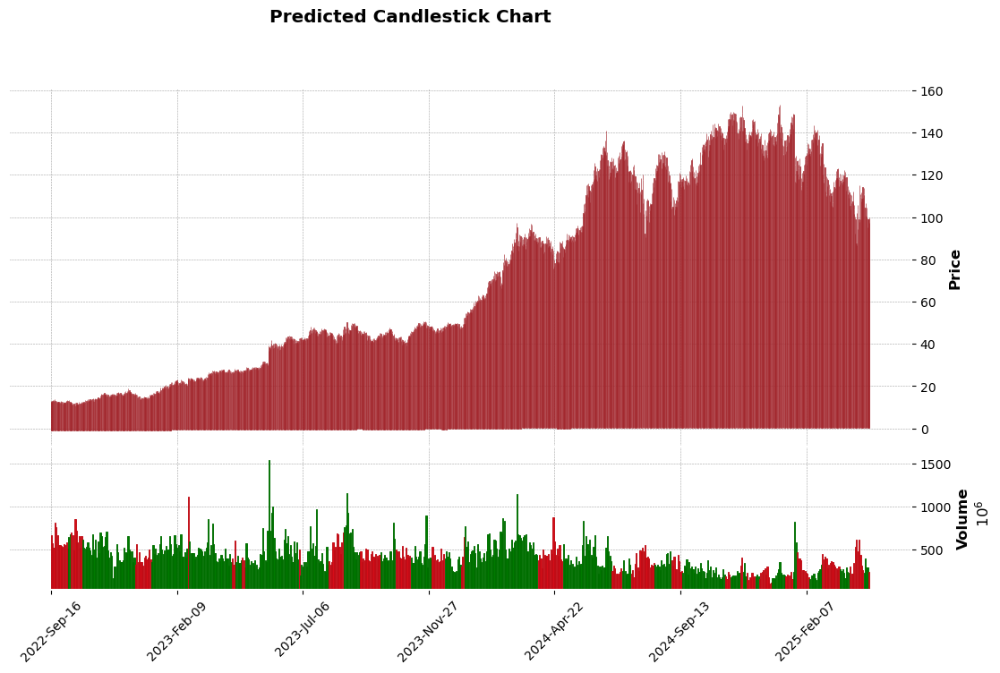

In [48]:
import mplfinance as mpf
predicted_prices = model_lstm.predict(x_test)
predicted_df = df.iloc[-len(predicted_prices):].copy()  
predicted_df['Predicted Close'] = predicted_prices
predicted_df['Open'] = predicted_df['Open']  
predicted_df['High'] = predicted_df['High']
predicted_df['Low'] = predicted_df['Low']
predicted_df['Close'] = predicted_df['Predicted Close']  
final_df = predicted_df[['Open', 'High', 'Low', 'Close', 'Volume']].copy()
final_df.index = pd.to_datetime(predicted_df.index) 
mpf.plot(
    final_df,
    type='candle',
    volume=True,
    style='charles',
    title="Predicted Candlestick Chart",
    ylabel="Price",
    ylabel_lower="Volume",
    figsize=(14, 8) 
)

In [49]:
df = df.reset_index()  # This will move the index (Date) into a regular column.

In [50]:
# Assume df contains the main data with daily prices.
# Example data setup:
# df = pd.DataFrame({
#     'Open': [...],
#     'High': [...],
#     'Low': [...],
#     'Close': [...],
# })

# Ensure the DataFrame is ordered correctly
df['Date'] = pd.to_datetime(df['Date'])  # Assuming there is a column named Date
df.set_index('Date', inplace=True)

# Select prices for the candlestick
final_df = df[['Open', 'High', 'Low', 'Close']]
# Create the candlestick chart
candlestick_trace = go.Candlestick(
    x=final_df.index,
    open=final_df['Open'],
    high=final_df['High'],
    low=final_df['Low'],
    close=final_df['Close'],
    name='Candlestick',
    increasing_line_color='#2a9d8f',  # Color for increasing candles
    decreasing_line_color='#f4a261',    # Color for decreasing candles
)

# Create the figure
fig = go.Figure(data=[candlestick_trace])

# Add title and labels
fig.update_layout(
    title='Predicted Candlestick Chart',
    xaxis_title='Date',
    yaxis_title='Price',
    xaxis_rangeslider_visible=False,  # Disable the range slider below the chart
    template='plotly_white',            # Use a light template
    height=600,                         # Height of the chart
    width=1000                          # Width of the chart
)

# Show the chart
fig.show()

In [51]:
# Predicting the next 10 days
latest_prediction = []
last_seq = x_test[:-1]

for _ in range(30):
    prediction = model_lstm.predict(last_seq)
    latest_prediction.append(prediction)

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


In [52]:
df = df.reset_index()

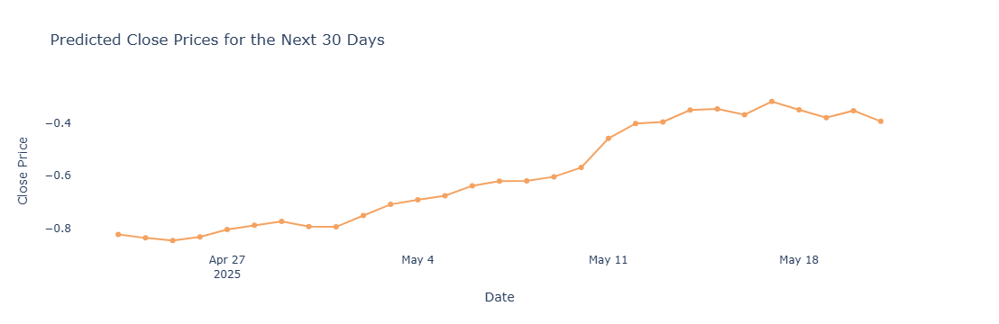

In [53]:
predicted_data_next = np.array(latest_prediction).reshape(-1, 10)
last_date = df['Date'].max()
next_30_days = [last_date + timedelta(days=i) for i in range(1, 30)]

# Iterate over all features
for i, feature_name in enumerate(['Open', 'High', 'Low', 'Volume', 'Close']):
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=next_30_days,
        y=predicted_data_next[:, i],
        mode='lines+markers',
        name=f'Predicted {feature_name.capitalize()} Prices',
        line=dict(color='#f4a261'), 
        marker=dict(color='#f4a261')  
    ))

    fig.update_layout(
        title=f'Predicted {feature_name.capitalize()} Prices for the Next 30 Days',
        xaxis_title='Date',
        yaxis_title=f'{feature_name.capitalize()} Price',
        plot_bgcolor='white' 
    )

fig.show()